In [85]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import math

In [86]:
# Set up paths
SCRIPT_DIR_PATH = os.getcwd()
PROJECT_DIR_PATH = os.path.dirname(SCRIPT_DIR_PATH)
MODEL_DIR_PATH = os.path.join(PROJECT_DIR_PATH, 'model')
OUTPUTS_DIR_PATH = os.path.join(MODEL_DIR_PATH, 'outputs')
BASELINE_DIR_PATH = os.path.join(OUTPUTS_DIR_PATH, 'baseline')
ENSEMBLE_DIR_PATH = os.path.join(OUTPUTS_DIR_PATH, 'ensemble')
EXP_DESIGN_DIR_PATH = os.path.join(OUTPUTS_DIR_PATH, 'exp_design')
CONFIG_DIR_PATH = os.path.join(MODEL_DIR_PATH, 'python_ver/config')

In [87]:
def simple_line_plot(df, x, y, title, xlabel, ylabel):
    fig, ax = plt.subplots()
    df.plot(x=x, y=y, ax=ax)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    plt.grid(True)
    plt.show()
    plt.close()
   
    return None

In [88]:
import yaml
config_yaml_path = os.path.join(CONFIG_DIR_PATH, 'ensemble_config_4.yaml')

# Read the ensemble configuration file
with open(config_yaml_path, 'r') as file:
    config = yaml.safe_load(file)
# Extract the parameters from the configuration
model_parameters = config['model_parameters']
parameter_keys = list(model_parameters.keys())
parameter_keys


['k_input_replenishment',
 'ef_inputs_capacity',
 'ef_complexity_support',
 'alpha_complexity_saturation',
 'k_cost_complexity',
 'k_capacity_drain',
 'k_complexity_growth',
 'k_complexity_decay',
 'k_integrity_gain',
 'k_integrity_loss_inputs',
 'r_population',
 'K_population',
 'ef_pop_inputs',
 'ef_pop_complexity',
 'ef_pop_capacity_drain',
 'k_pop_loss_inputs',
 'k_pop_loss_integrity']

## Baseline Plots

In [89]:
baseline_df = pd.read_csv(os.path.join(BASELINE_DIR_PATH, 'baseline_config_4_output.csv'))
baseline_df.head()

,time,State_Inputs,State_Capacity,Administrative_Complexity,State_Integrity,Population
0,0.00,1.000000,0.500000,0.100000,0.050000,0.100000
1,0.01,0.999805,0.500403,0.100145,0.050250,0.100009
2,0.02,0.999610,0.500805,0.100290,0.050500,0.100017
3,0.03,0.999415,0.501208,0.100435,0.050750,0.100026
4,0.04,0.999221,0.501610,0.100581,0.051001,0.100034


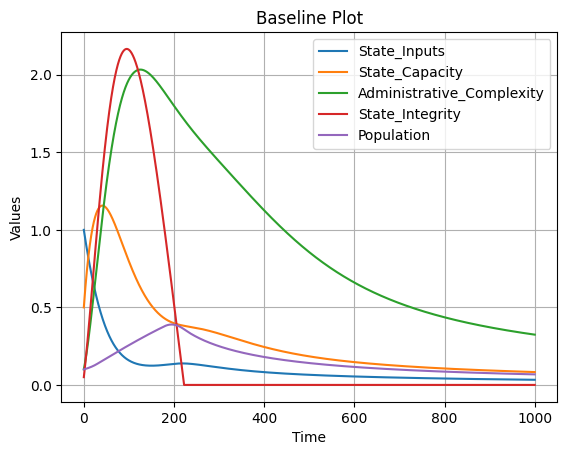

In [90]:
state_variables = ["State_Inputs", "State_Capacity", "Administrative_Complexity", "State_Integrity", "Population"]

# Plot the data
simple_line_plot(baseline_df, 'time', state_variables, 'Baseline Plot', 'Time', 'Values')

## Ensemble

In [91]:
output_df = pd.read_csv(os.path.join(ENSEMBLE_DIR_PATH, 'ensemble_config_4_output.csv'))
output_df.head()

,State_Inputs,State_Capacity,Administrative_Complexity,State_Integrity,Population,time,run_id
0,1.000000,0.500000,0.100000,0.050000,0.100000,0.0,1.0
1,0.997070,0.509010,0.103077,0.054010,0.100072,0.2,1.0
2,0.994144,0.517938,0.106205,0.058063,0.100144,0.4,1.0
3,0.991224,0.526784,0.109383,0.062159,0.100216,0.6,1.0
4,0.988309,0.535549,0.112611,0.066298,0.100288,0.8,1.0


In [92]:
output_df

,State_Inputs,State_Capacity,Administrative_Complexity,State_Integrity,Population,time,run_id
0,1.000000,0.500000,0.100000,0.050000,0.100000,0.0,1.0
1,0.997070,0.509010,0.103077,0.054010,0.100072,0.2,1.0
2,0.994144,0.517938,0.106205,0.058063,0.100144,0.4,1.0
3,0.991224,0.526784,0.109383,0.062159,0.100216,0.6,1.0
4,0.988309,0.535549,0.112611,0.066298,0.100288,0.8,1.0
...,...,...,...,...,...,...,...
500095,0.000008,0.000112,0.002519,-0.000305,0.000006,999.2,100.0
500096,0.000008,0.000112,0.002514,-0.000305,0.000006,999.4,100.0
500097,0.000008,0.000112,0.002508,-0.000305,0.000006,999.6,100.0
500098,0.000008,0.000111,0.002503,-0.000305,0.000006,999.8,100.0


In [93]:
# Load experiment data
exp_design_df = pd.read_csv(os.path.join(EXP_DESIGN_DIR_PATH, 'exp_design_ensemble_config_4_output.csv'))
exp_design_df.head()

,k_input_replenishment,ef_inputs_capacity,ef_complexity_support,alpha_complexity_saturation,k_cost_complexity,k_capacity_drain,k_complexity_growth,k_complexity_decay,k_integrity_gain,k_integrity_loss_inputs,r_population,K_population,ef_pop_inputs,ef_pop_complexity,ef_pop_capacity_drain,k_pop_loss_inputs,k_pop_loss_integrity,run_id
0,1.469034,1.182748,1.211673,0.721246,0.934154,1.430654,1.037367,0.784866,0.797729,0.953315,0.882041,0.557121,1.108729,0.971854,1.460985,1.235829,1.146498,1
1,1.387978,0.751097,1.202719,1.138542,0.857632,1.281201,0.840979,0.991124,1.093654,0.974236,0.505745,0.948815,1.095192,0.681653,1.156684,1.050304,1.223981,2
2,0.698040,1.493542,1.393196,1.193706,1.076828,0.668715,1.330652,1.336519,1.442834,1.152873,1.091947,0.793423,0.679691,0.585553,0.648652,1.015292,0.612564,3
3,0.847411,0.681983,1.425844,0.749353,1.348613,0.861159,1.271748,1.465906,1.156975,0.983007,1.219752,1.377860,0.991464,0.510520,0.504024,1.302130,1.189914,4
4,0.780935,0.937545,1.363824,1.029054,1.221177,1.152211,0.582225,0.883809,0.519634,1.060486,0.769274,0.723081,1.204898,1.155218,0.972740,0.704071,0.630984,5


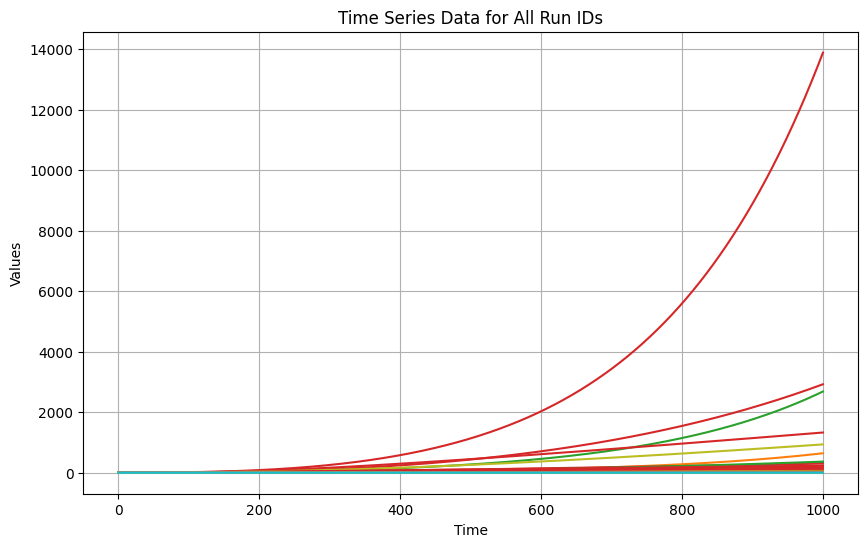

In [94]:
# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Define the columns to plot
columns_to_plot = ["State_Inputs", "State_Capacity", "Administrative_Complexity", "State_Integrity", "Population"]

# Loop through each unique 'run_id'
for run_id in output_df['run_id'].unique():
    subset = output_df[output_df['run_id'] == run_id]
    for column in columns_to_plot:
        ax.plot(subset['time'], subset[column], label=f'{column} Run ID {run_id}')

# Adding plot title and labels
ax.set_title('Time Series Data for All Run IDs')
ax.set_xlabel('Time')
ax.set_ylabel('Values')
ax.grid(True)

# Show the plot
plt.show()

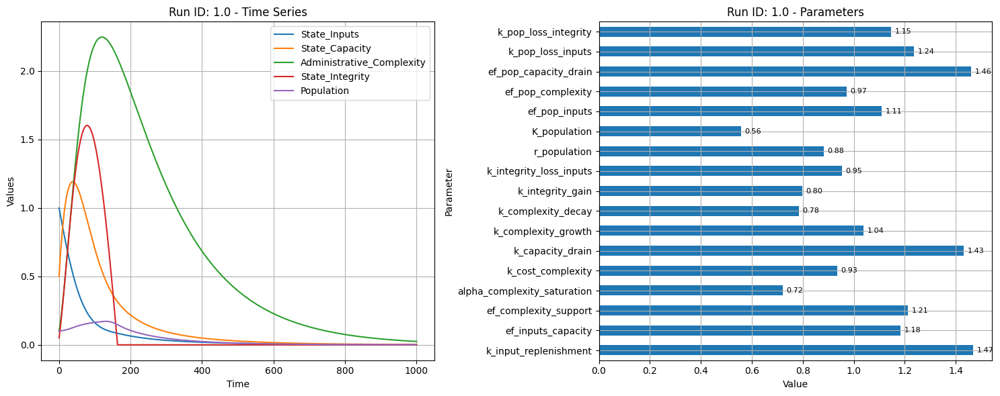

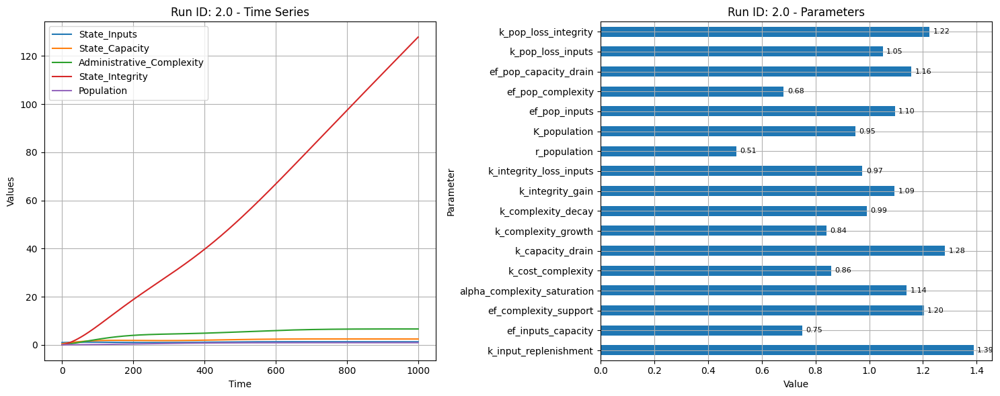

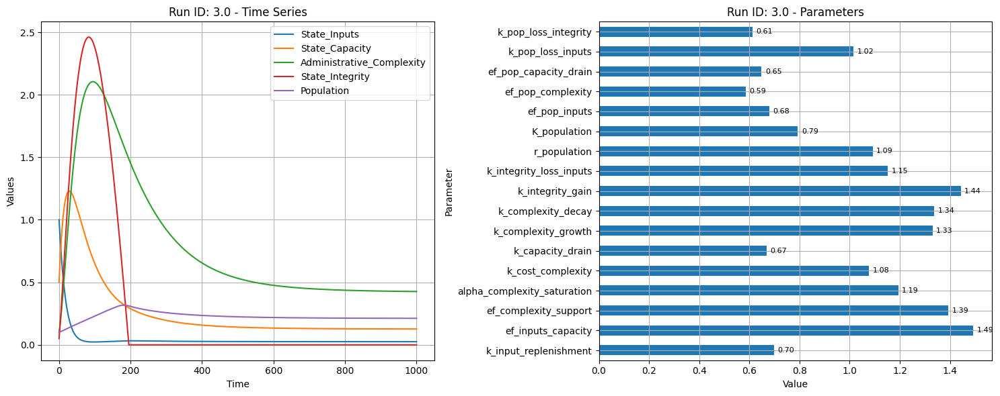

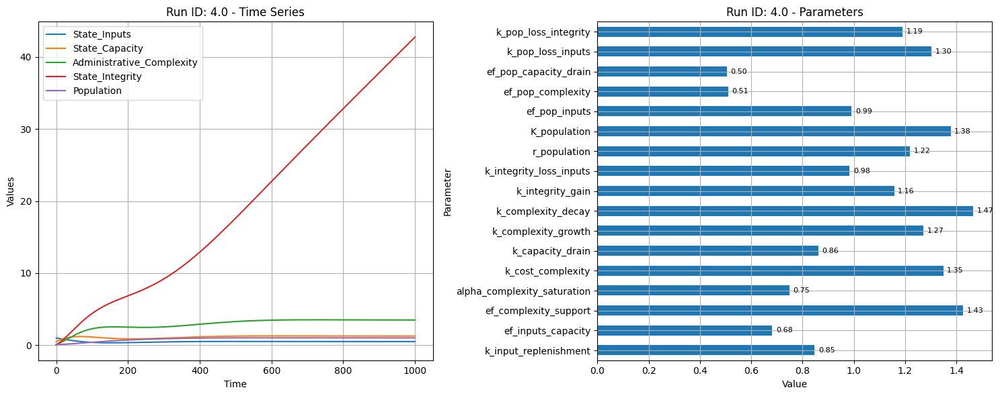

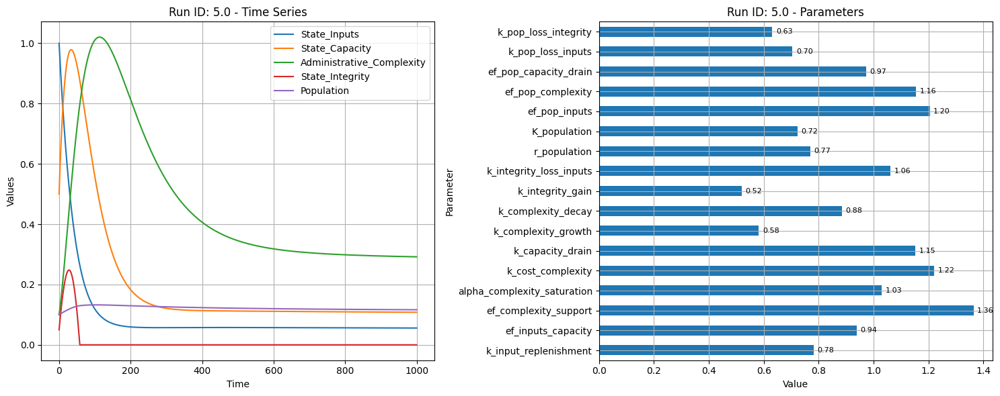

...

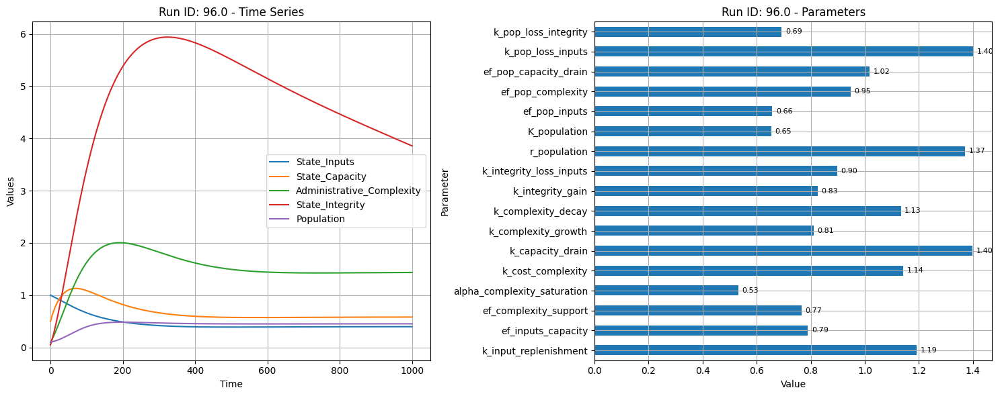

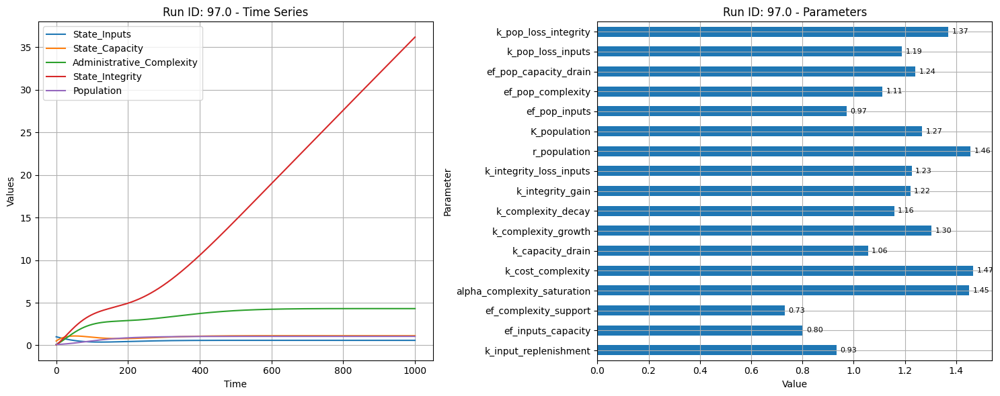

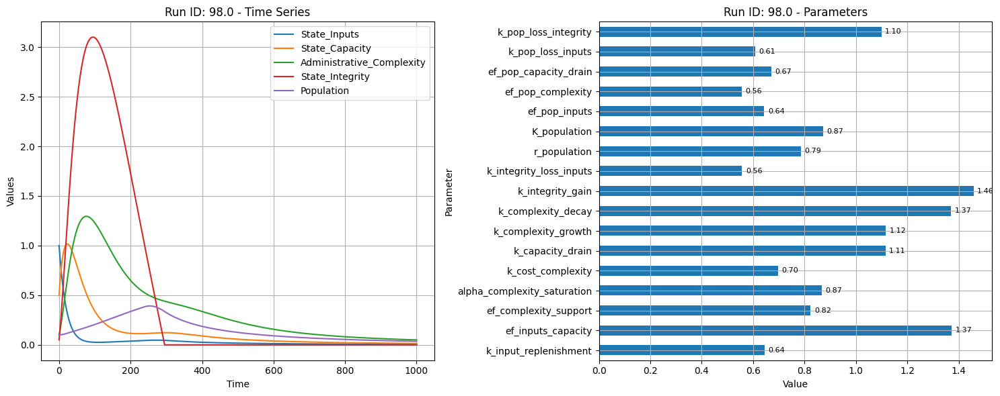

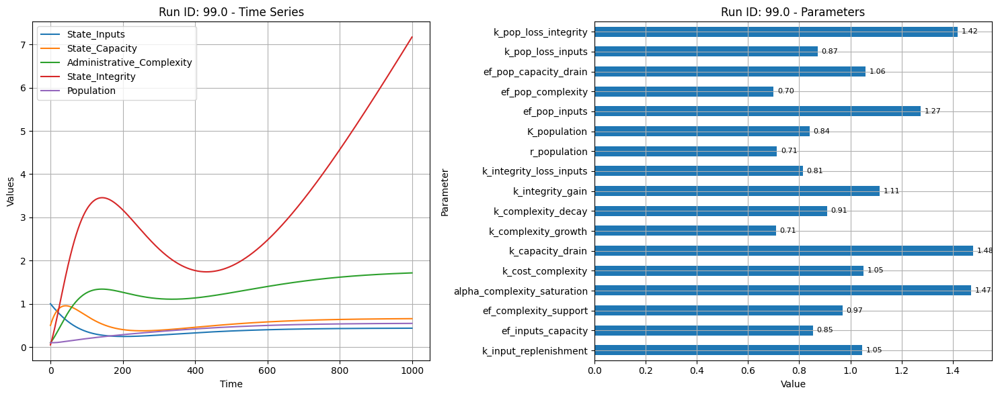

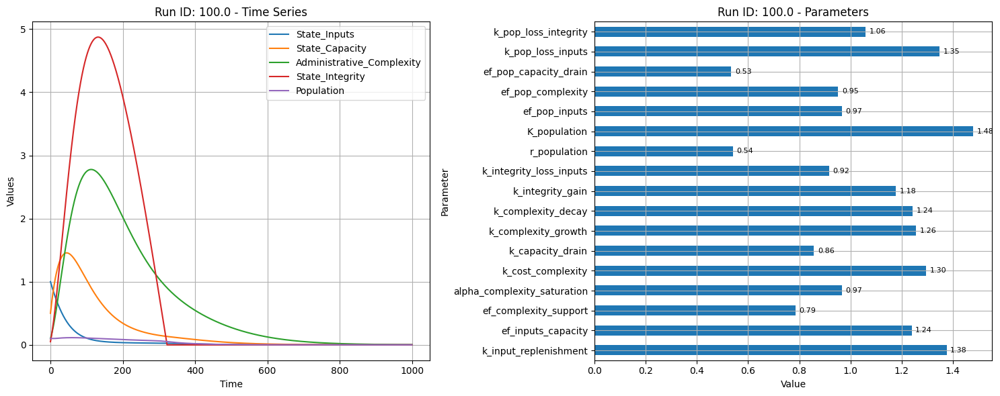

In [95]:
# Define the columns you want to plot.


stocks_to_plot = ["State_Inputs", "State_Capacity", "Administrative_Complexity", "State_Integrity", "Population"]

# Loop over each run_id and create one figure with two subplots.
for run_id in output_df['run_id'].unique():
    subset_output = output_df[output_df['run_id'] == run_id]
    subset_exp_design = exp_design_df[exp_design_df['run_id'] == run_id]
    
    # Create a figure with 1 row and 2 columns of subplots.
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Time series plot on the left subplot.
    subset_output.plot(x='time', y=stocks_to_plot, ax=ax1, title=f'Run ID: {run_id} - Time Series')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Values')
    ax1.legend()
    ax1.grid(True)
    
    # Horizontal bar plot on the right subplot.
    # Use the first row of exp_design data for this run_id.
    data_bar = subset_exp_design[parameter_keys].iloc[0]
    data_bar.plot(kind='barh', ax=ax2, title=f'Run ID: {run_id} - Parameters')
    ax2.set_xlabel('Value')
    ax2.set_ylabel('Parameter')
    ax2.grid(True)
    
    # Add labels to each bar with the actual value.
    # Compute an offset relative to the maximum value so the text doesn't overlap the bar.
    offset = data_bar.max() * 0.01  
    for patch in ax2.patches:
        ax2.text(patch.get_width() + offset, 
                 patch.get_y() + patch.get_height() / 2,
                 f'{patch.get_width():.2f}', 
                 ha='left', va='center', fontsize=8)
    
    plt.tight_layout()
    plt.show()


In [96]:
# for run_id in output_df['run_id'].unique():
#     subset = output_df[output_df['run_id'] == run_id]
#     subset.plot(x='time', y=columns_to_plot, figsize=(10, 6), title=f'Run ID: {run_id}')
#     plt.xlabel('Time')
#     plt.ylabel('Values')
#     plt.legend()
#     plt.grid(True)
#     plt.show()


In [97]:
# for run_id in output_df['run_id'].unique():
#     subset = output_df[(output_df['run_id'] == run_id) & (output_df['time'] < 10)]
#     subset.plot(x='time', y=columns_to_plot, figsize=(10, 6), title=f'Run ID: {run_id}')
#     plt.xlabel('Time')
#     plt.ylabel('Values')
#     plt.legend()
#     plt.grid(True)
#     plt.show()
